# 🛰️ LiDAR & Copernicus DEM Processing Workflow

This notebook demonstrates a full workflow to acquire, process, and compare high-resolution elevation datasets over a selected region of interest (ROI).

## ✅ Steps Overview

1) **Search for LiDAR datasets (50 cm² resolution)**  
   - Query available French LiDAR datasets.
   - Select a single dataset of interest.

2) **Define ROI & Identify Available Tiles**  
   - Specify a bounding box around the target area.
   - Locate all LiDAR tiles (1 km² each) intersecting the ROI.

3) **Download LiDAR Tiles**  
   - Retrieve only the required tiles.
   - Optionally merge and/or crop them to the ROI.

4) **Download Copernicus DEM (30 m resolution)**  
   - Retrieve lower-resolution data covering the same ROI.

5) **Compare Both DEMs**  
   - Plot LiDAR vs. Copernicus DEM.
   - Display with contextual basemap (e.g. `contextily`) for spatial reference.

---


In [6]:
# import os, sys
# import geopandas as gpd
# import requests
# from urllib.parse import urlencode

# import matplotlib.pyplot as plt
# from shapely.geometry import Point
# from pyproj import Transformer
# import contextily as cx

# import requests
# from lxml import etree
# from shapely.geometry import box

# import rasterio

# from rasterio.merge import merge
# from rasterio.mask import mask
# from rasterio.io import MemoryFile
# import os

# from pyproj import Transformer


In [7]:
# ─────────────────────────────────────────────────────────
# Standard library
# ─────────────────────────────────────────────────────────
import os
import sys
from urllib.parse import urlencode

# ─────────────────────────────────────────────────────────
# Third-party libraries
# ─────────────────────────────────────────────────────────
import contextily as cx
import geopandas as gpd
import matplotlib.pyplot as plt
import rasterio
import requests
from lxml import etree
from pyproj import Transformer
from rasterio.io import MemoryFile
from rasterio.mask import mask
from rasterio.merge import merge
from shapely.geometry import Point, box


In [8]:

def list_layers_wfs(url):
    params = {
        "SERVICE": "WFS",
        "REQUEST": "GetCapabilities",
        "VERSION": "2.0.0"
    }
    r = requests.get(url, params=params)
    r.raise_for_status()

    root = etree.fromstring(r.content)
    ns = {"wfs": "http://www.opengis.net/wfs/2.0"}

    layers = root.findall(".//wfs:FeatureType/wfs:Name", namespaces=ns)
    return [l.text for l in layers]

def download_tiles(sel_gdf, url_field, out_dir="tiles"):
    os.makedirs(out_dir, exist_ok=True)
    for idx, row in sel_gdf.iterrows():
        url = row[url_field]
        fname = os.path.join(out_dir, os.path.basename(url))
        if os.path.exists(fname):
            print("Already have", fname)
            continue
        print("Downloading", url)
        r = requests.get(url, stream=True)
        if r.status_code != 200:
            print("Failed:", url, r.status_code)
            continue
        with open(fname, 'wb') as f:
            for chunk in r.iter_content(chunk_size=8192):
                if chunk:
                    f.write(chunk)
            print("Saved to ", fname)
    print("Download complete.")

def filter_tiles(gdf, bbox):
    # bbox dict with lon_min, lat_min, lon_max, lat_max in same CRS
    import shapely.geometry as geom
    box_geom = geom.box(bbox["lon_min"], bbox["lat_min"], bbox["lon_max"], bbox["lat_max"])
    sel = gdf[gdf.intersects(box_geom)]
    return sel


def get_tile_index(layer_name, save_path=None):
    wfs_url = "https://data.geopf.fr/wfs/ows"
    params = {
        "SERVICE": "WFS",
        "VERSION": "2.0.0",
        "REQUEST": "GetFeature",
        "TYPENAMES": layer_name,
        "OUTPUTFORMAT": "application/json"
    }
    resp = requests.get(wfs_url, params=params, stream=True)
    resp.raise_for_status()
    geojson = resp.json()
    gdf = gpd.GeoDataFrame.from_features(geojson["features"], crs="EPSG:2154")  # assume EPSG:2154/Lambert‑93
    if save_path:
        gdf.to_file(save_path, driver="GPKG")
    return gdf



def plot_tile_centroids_with_basemap(gdf, name="LIDAR", crs_source="EPSG:2154", crs_target="EPSG:4326"):
    """
    Plot the centroids of all tiles on a map of France with basemap.
    
    Parameters:
        gdf : GeoDataFrame
            GeoDataFrame containing tile polygons in Lambert-93 (EPSG:2154)
        crs_source : str
            CRS of the input gdf (default EPSG:2154)
        crs_target : str
            CRS to transform centroids to (default EPSG:4326 / WGS84)
    """
    # Transformer Lambert-93 -> WGS84
    transformer = Transformer.from_crs(crs_source, crs_target, always_xy=True)
    
    # Compute centroids and transform coordinates
    centroids_lonlat = []
    for geom in gdf.geometry:
        centroid = geom.centroid
        lon, lat = transformer.transform(centroid.x, centroid.y)
        centroids_lonlat.append((lon, lat))
    
    # Create GeoDataFrame of points in WGS84
    points_gdf = gpd.GeoDataFrame(
        geometry=[Point(lon, lat) for lon, lat in centroids_lonlat],
        crs=crs_target
    )
        
    # Plot
    fig, ax = plt.subplots(figsize=(10, 12))
    points_gdf.plot(ax=ax, color="red", markersize=5, label="Tile centroids")
    
    # Add basemap using contextily
    cx.add_basemap(ax, crs=points_gdf.crs.to_string(), source=cx.providers.CartoDB.Voyager)
    
    ax.set_title(name)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    plt.legend()
    plt.show()

def download_cop_dem(bbox, api_key, output_file):
    product = "COP30"

    # -----------------------
    # Build request URL
    # -----------------------
    API_URL = (
        "https://portal.opentopography.org/API/globaldem"
        f"?demtype={product}"
        f"&south={bbox['lat_min']}&north={bbox['lat_max']}"
        f"&west={bbox['lon_min']}&east={bbox['lon_max']}"
        "&outputFormat=GTiff"
        f"&API_Key={api_key}"
    )

    print("Request:", API_URL)

    # Download raster directly
    response = requests.get(API_URL, stream=True)

    if response.status_code != 200:
        print("\n❌ HTTP error:", response.status_code)
        print(response.text)
        raise SystemExit

    # Save to file
    with open(output_file, "wb") as f:
        for chunk in response.iter_content(chunk_size=8192):
            if chunk:
                f.write(chunk)

    print("✅ Saved →", output_file)

def download_contextly_image(bbox):
    """
    Downloads a contextual basemap image (e.g., for visualization) for the given bounding box.

    Parameters:
    - bbox (shapely.geometry.Polygon): Bounding box as a shapely box geometry.

    Returns:
    - cx_img (ndarray): Image array of the map tiles covering the bounding box.
    """

    cx_img, ext = cx.bounds2img(bbox["lon_min"],
                             bbox["lat_min"],
                             bbox["lon_max"],
                             bbox["lat_max"],
                             ll=True,
                             source=cx.providers.CartoDB.Voyager)

    return cx_img

def clip_and_merge_tiles(tile_paths, roi_geom, output_path):

    # Open datasets
    srcs = [rasterio.open(p) for p in tile_paths]

    # 1) Merge
    mosaic, mosaic_transform = merge(srcs)

    # Copy metadata
    meta = srcs[0].meta.copy()
    meta.update({
        "height": mosaic.shape[1],
        "width":  mosaic.shape[2],
        "transform": mosaic_transform
    })

    # Properly close
    for s in srcs:
        s.close()

    # 2) Clip
    with MemoryFile() as memfile:
        with memfile.open(**meta) as tmp:
            tmp.write(mosaic)

            clipped, clipped_transform = mask(
                tmp,
                [roi_geom],
                crop=True
            )

    # 3) Save output
    meta.update({
        "height": clipped.shape[1],
        "width":  clipped.shape[2],
        "transform": clipped_transform
    })

    os.makedirs(os.path.dirname(output_path), exist_ok=True)

    with rasterio.open(output_path, "w", **meta) as dst:
        dst.write(clipped)

    return clipped, clipped_transform

### Settings

In [9]:
##### TO BE FILLED BY USER #####
api_key = "38b3211483d503ddd81882f2259b6201"   # <-- put your api key of opentopography here

base_dir = "/home/renauld/DSM/"
data_dir = os.path.join(base_dir, "data")

area = "Caen"
# Define bbox in WGS84
lon_wgs84, lat_wgs84 = -0.3, 49.2  # Caen
box_size = 0.01 # degrees
#####

##### Create output directories #####
lidar_original_dir= os.path.join(data_dir, area, "lidar50cm_tiles")
lidar_output_dir = os.path.join(data_dir, area, "lidar50cm_roi")
cop_dir = os.path.join(data_dir, area, "cop30m_tiles")

os.makedirs(lidar_original_dir, exist_ok=True)
os.makedirs(lidar_output_dir, exist_ok=True)
os.makedirs(cop_dir, exist_ok=True)
#####

##### Coordinate transformers from WGS84 to Lambert-93 #####
transformer_to_l93 = Transformer.from_crs("EPSG:4326", "EPSG:2154", always_xy=True)
transformer_to_wgs84 = Transformer.from_crs("EPSG:2154", "EPSG:4326", always_xy=True)

lon_min_wgs84, lat_min_wgs84 = lon_wgs84 - box_size, lat_wgs84 - box_size
lon_max_wgs84, lat_max_wgs84 = lon_wgs84 + box_size, lat_wgs84 + box_size
bbox_wgs84 = {"lon_min": lon_min_wgs84, "lat_min": lat_min_wgs84, "lon_max": lon_max_wgs84, "lat_max": lat_max_wgs84}

# Convert bbox to Lambert-93
lon_min_l93, lat_min_l93 = transformer_to_l93.transform(lon_min_wgs84, lat_min_wgs84)
lon_max_l93, lat_max_l93 = transformer_to_l93.transform(lon_max_wgs84, lat_max_wgs84)
bbox_l93 = {"lon_min": lon_min_l93, "lat_min": lat_min_l93, "lon_max": lon_max_l93, "lat_max": lat_max_l93}
roi_geom_l93 = box(lon_min_l93, lat_min_l93, lon_max_l93, lat_max_l93)
#####



### Visualize the available Lidar database on the the IGN WFS endpoint


Available LiDAR layers:
Number of tiles: 180


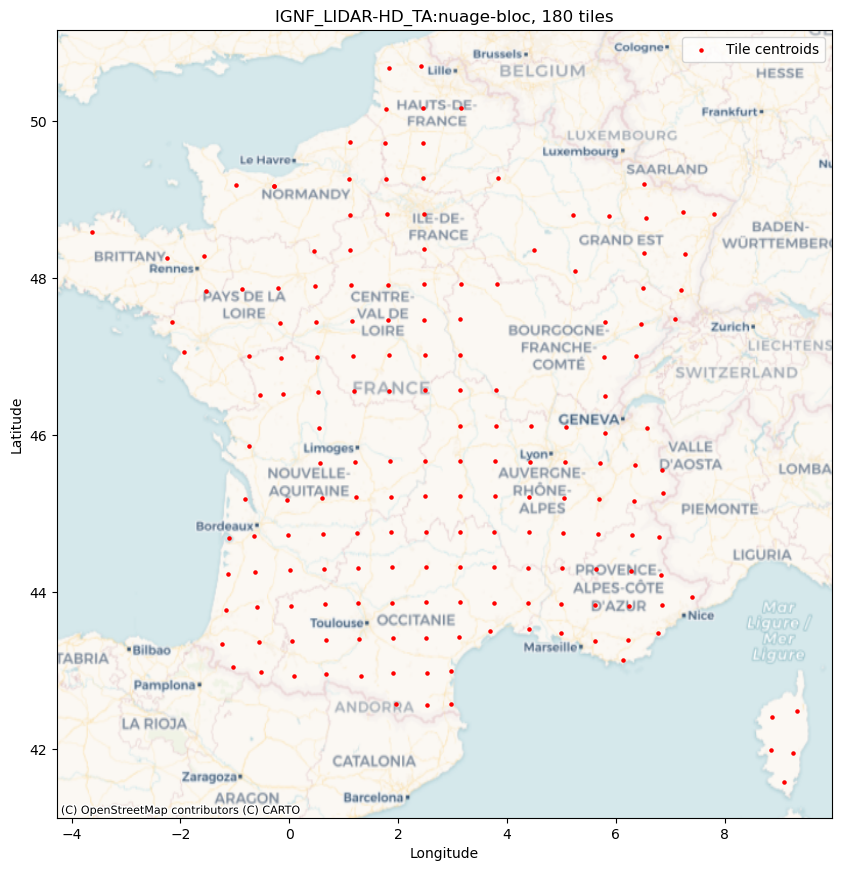

Number of tiles: 198


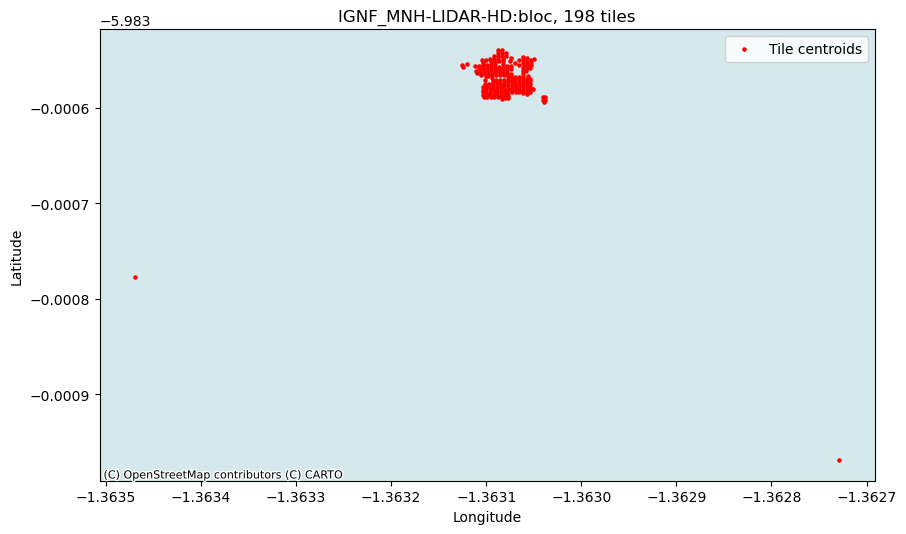

Number of tiles: 197


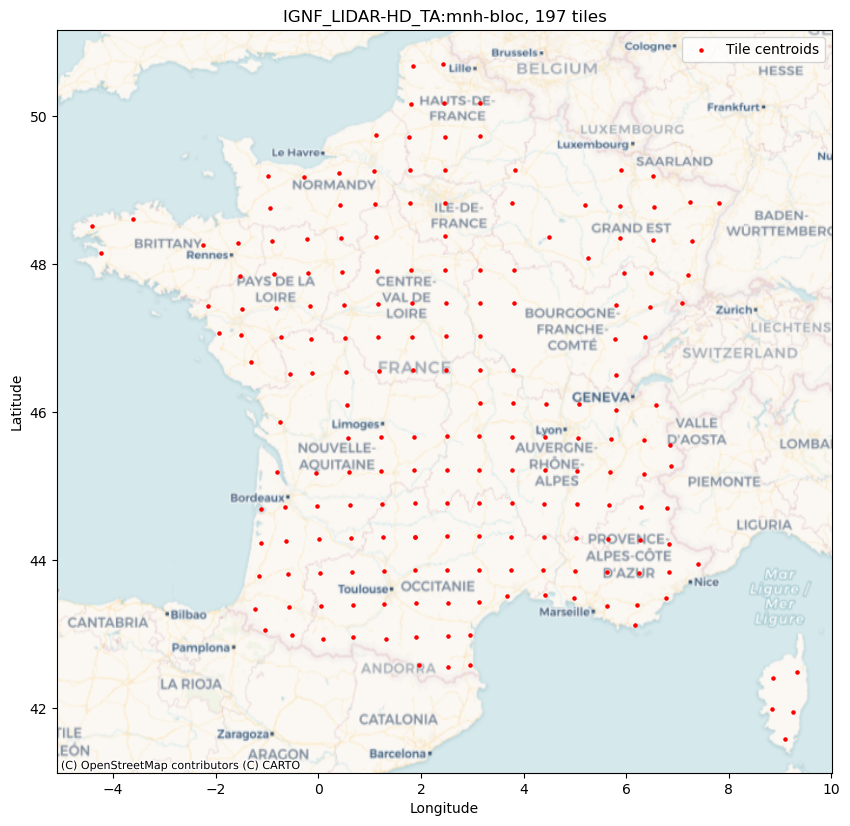

Number of tiles: 197


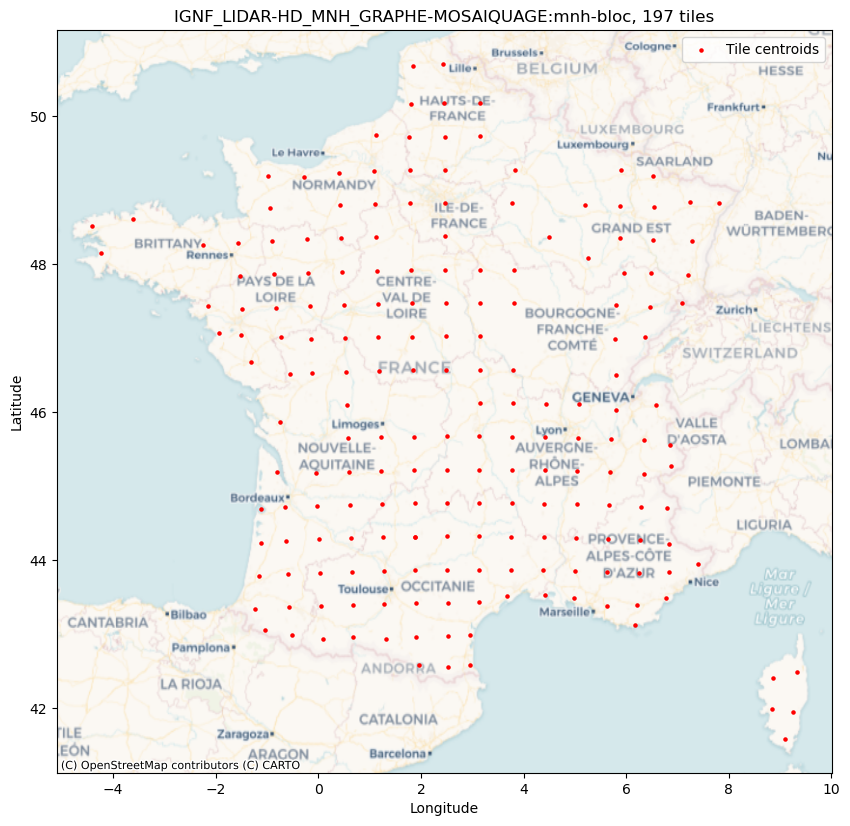

Number of tiles: 198


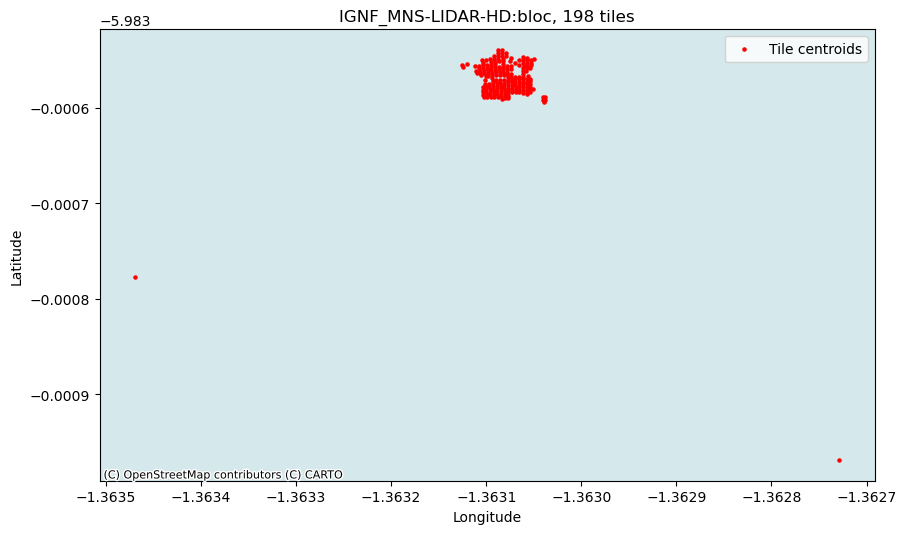

Number of tiles: 197


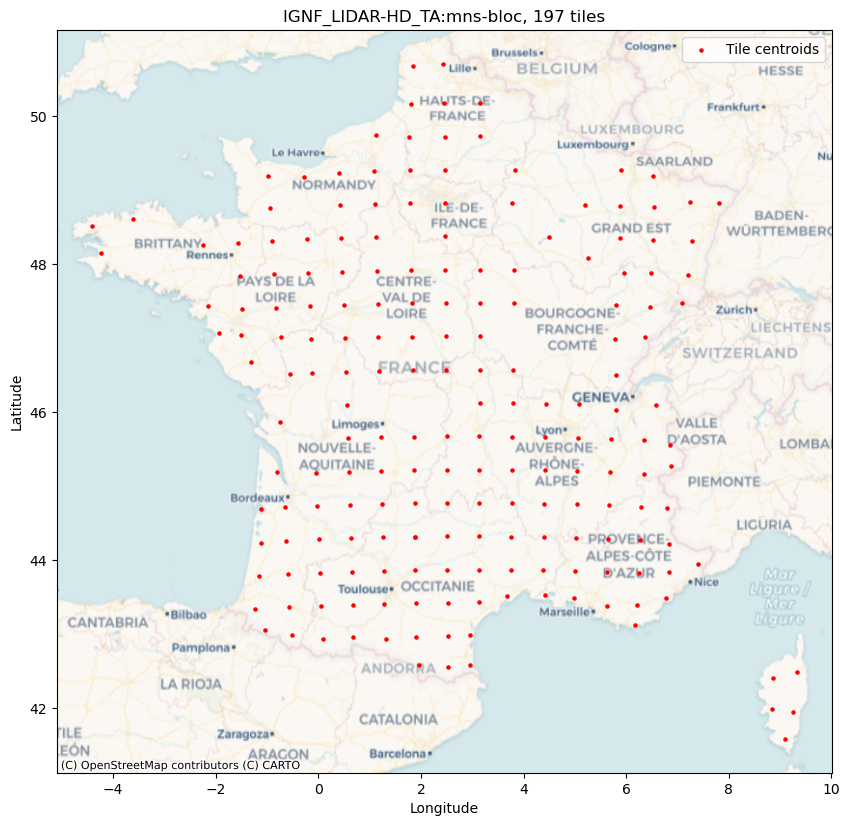

Number of tiles: 197


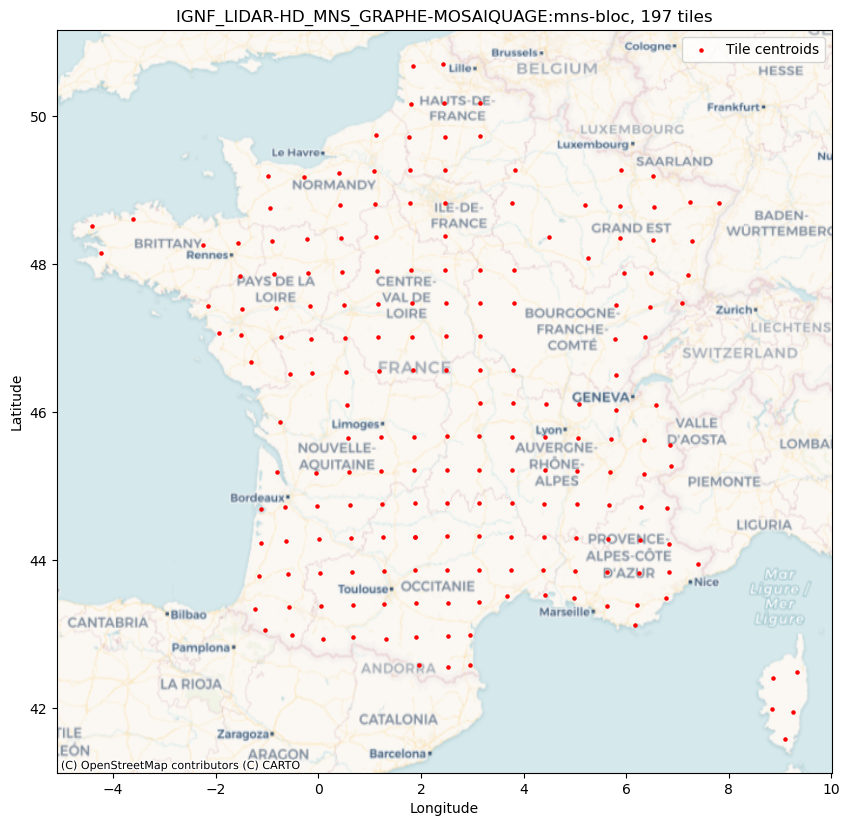

Number of tiles: 198


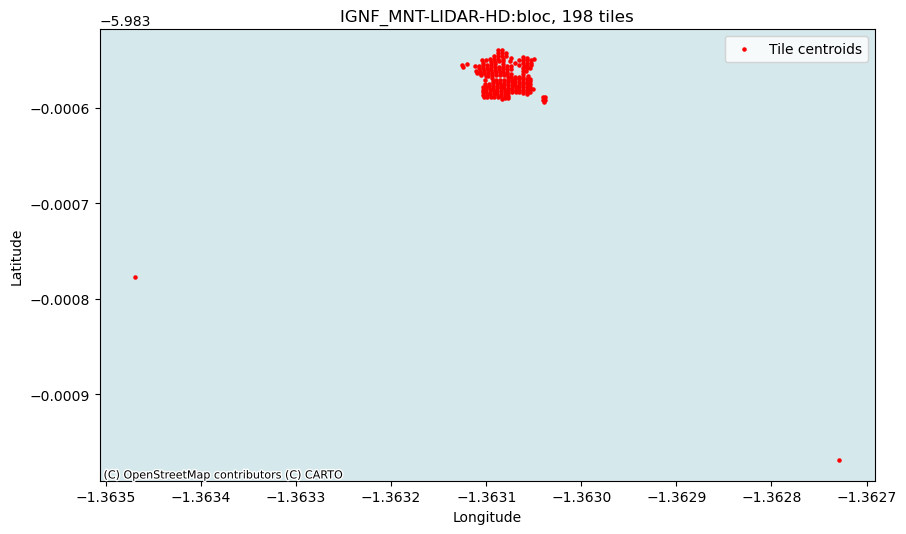

Number of tiles: 197


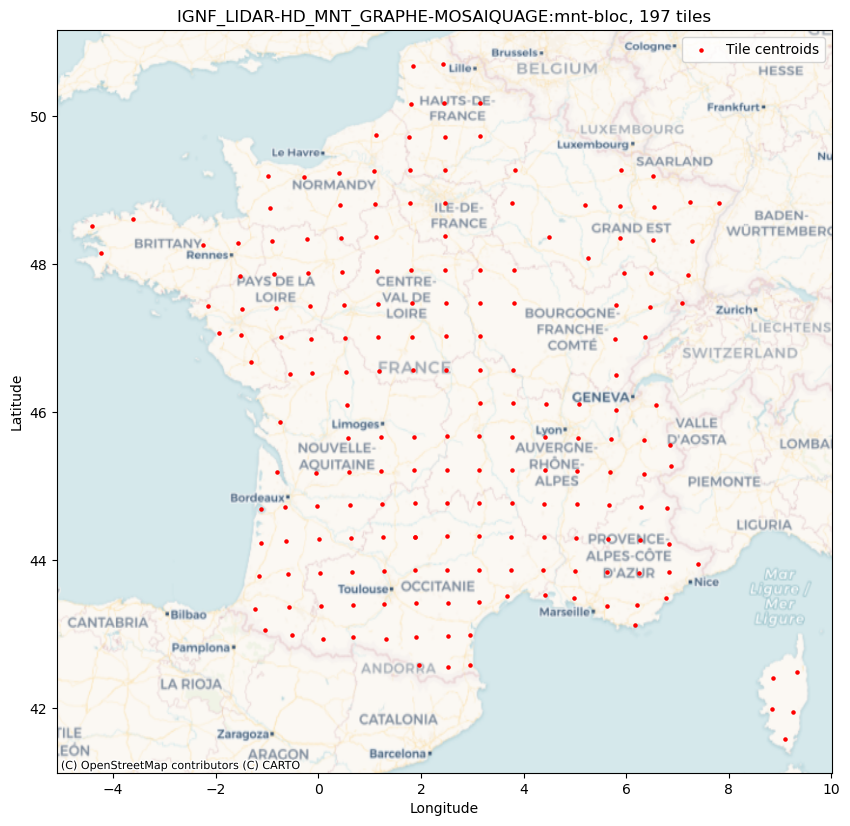

Number of tiles: 197


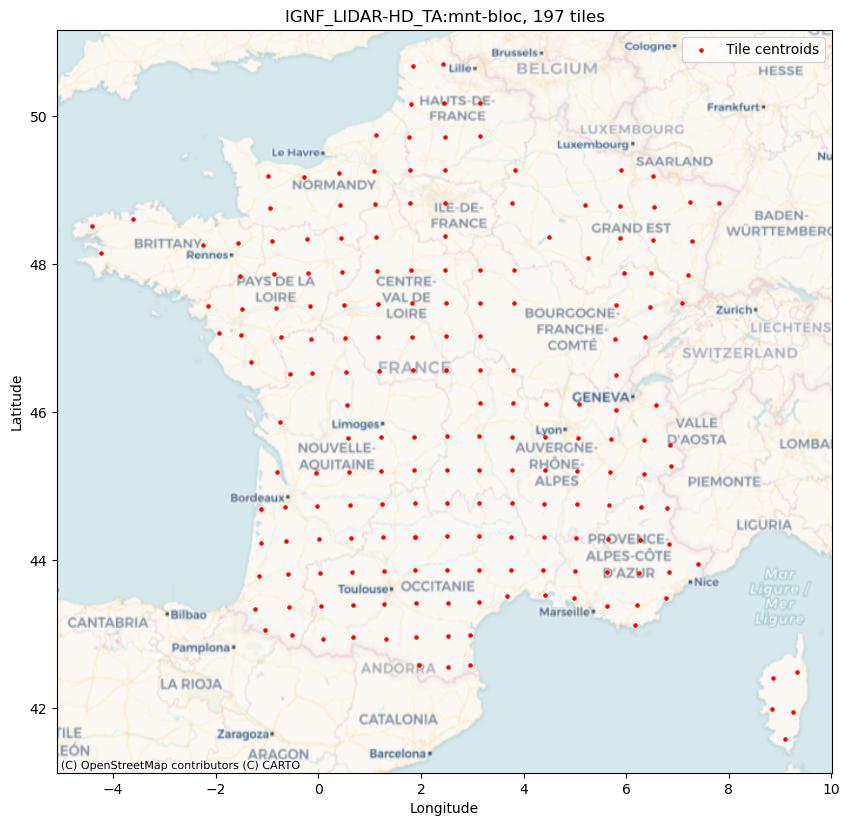

Number of tiles: 198


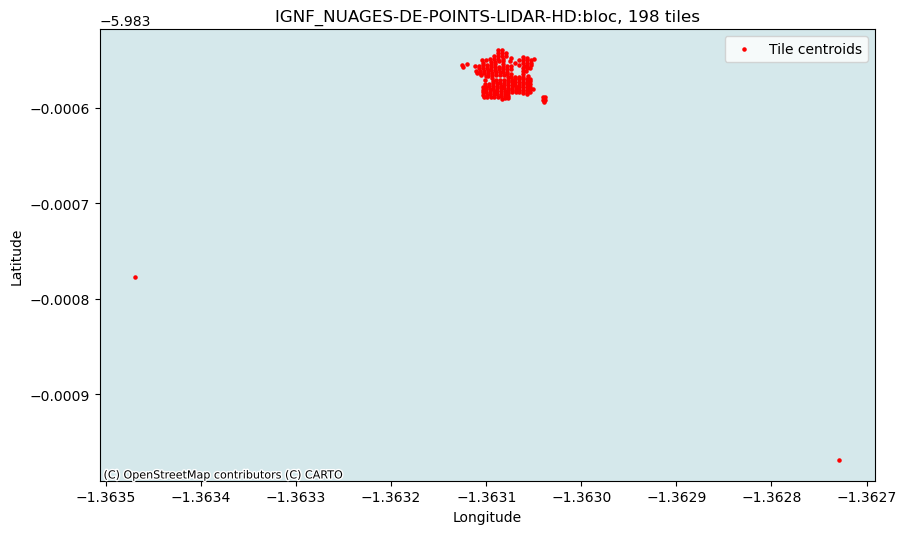

Number of tiles: 5000


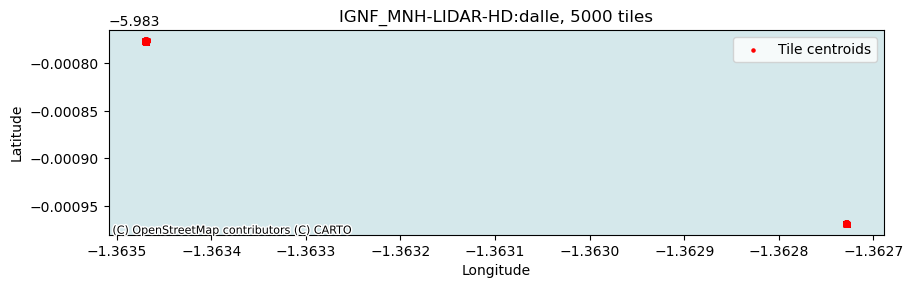

Number of tiles: 5000


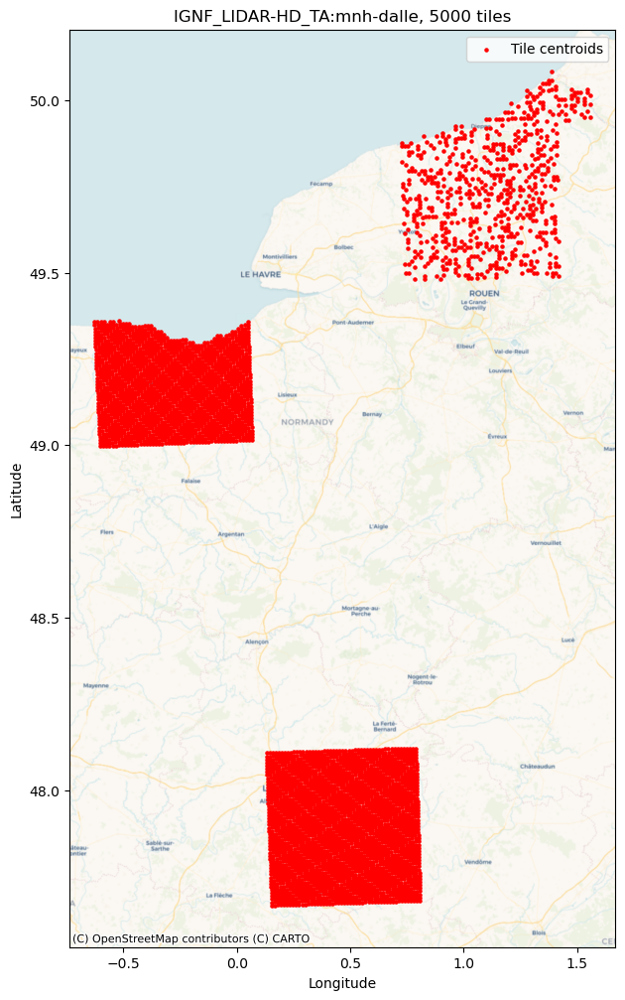

Number of tiles: 5000


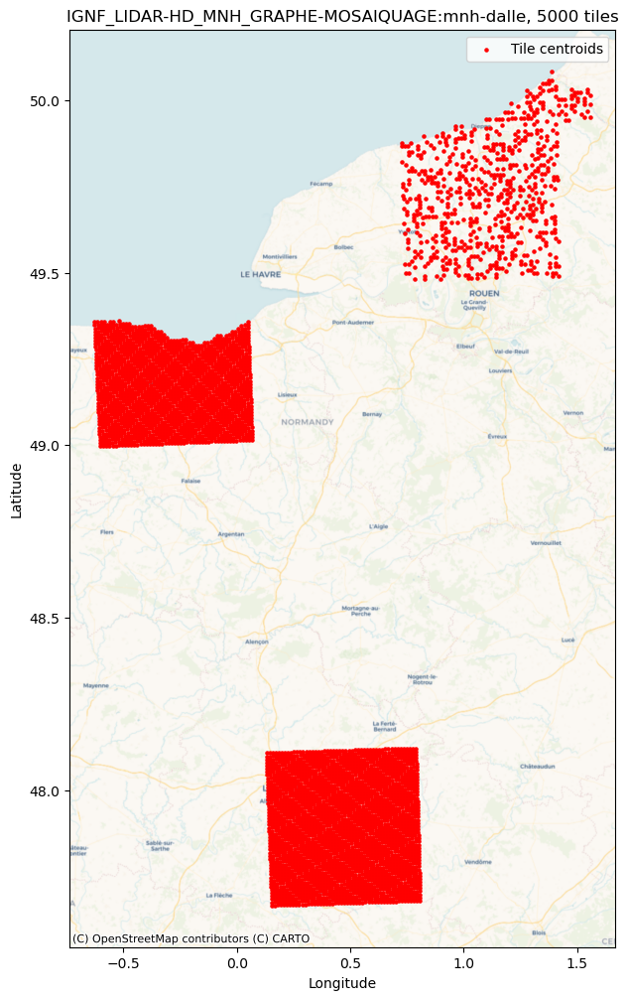

Number of tiles: 5000


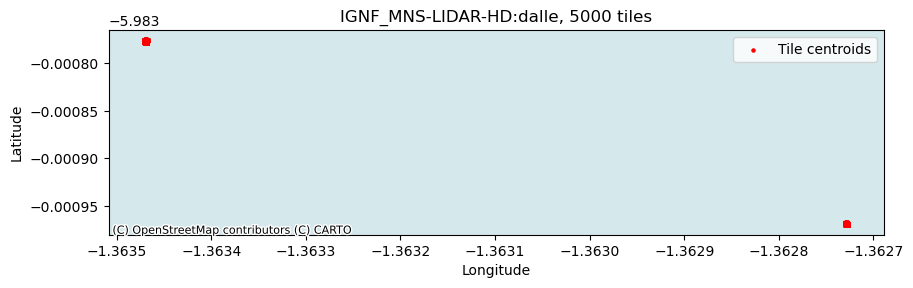

Number of tiles: 5000


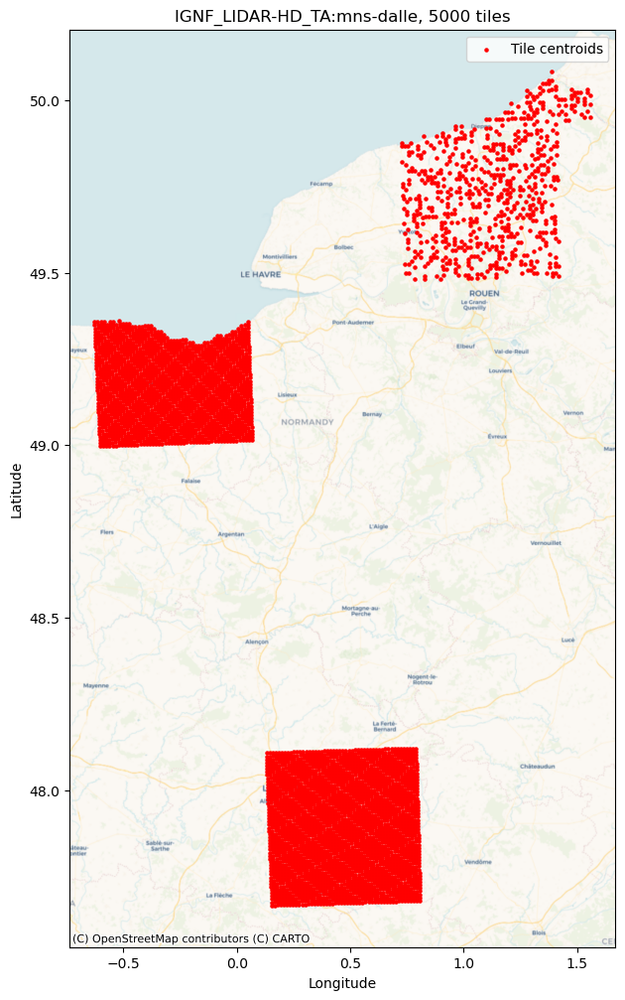

Number of tiles: 5000


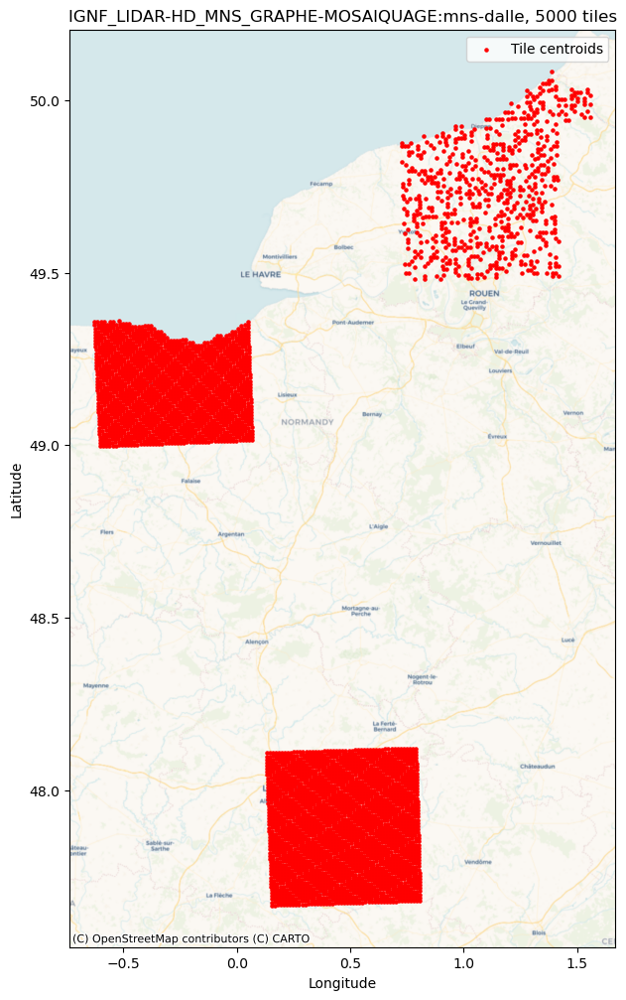

Number of tiles: 5000


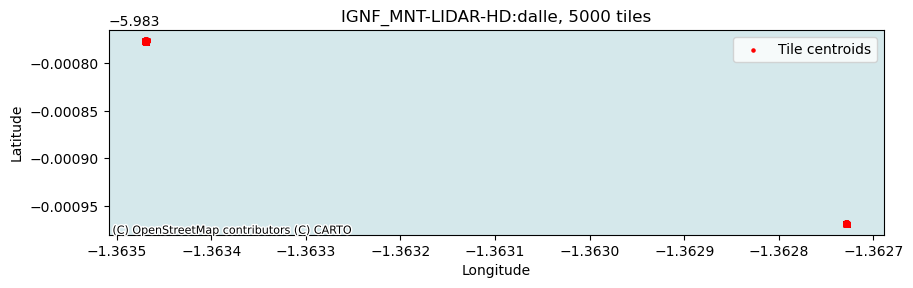

Number of tiles: 5000


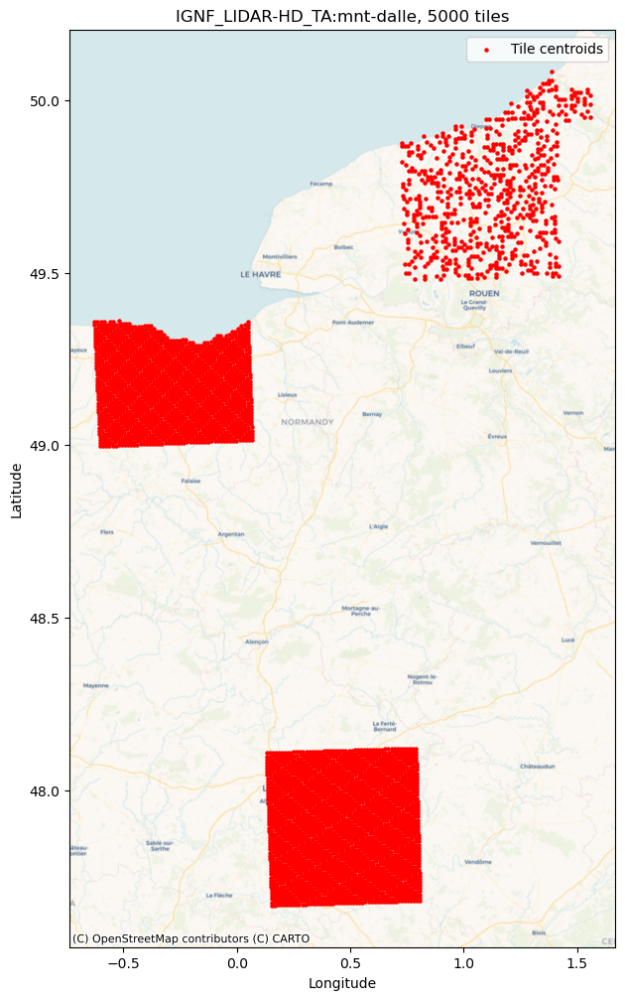

Number of tiles: 5000


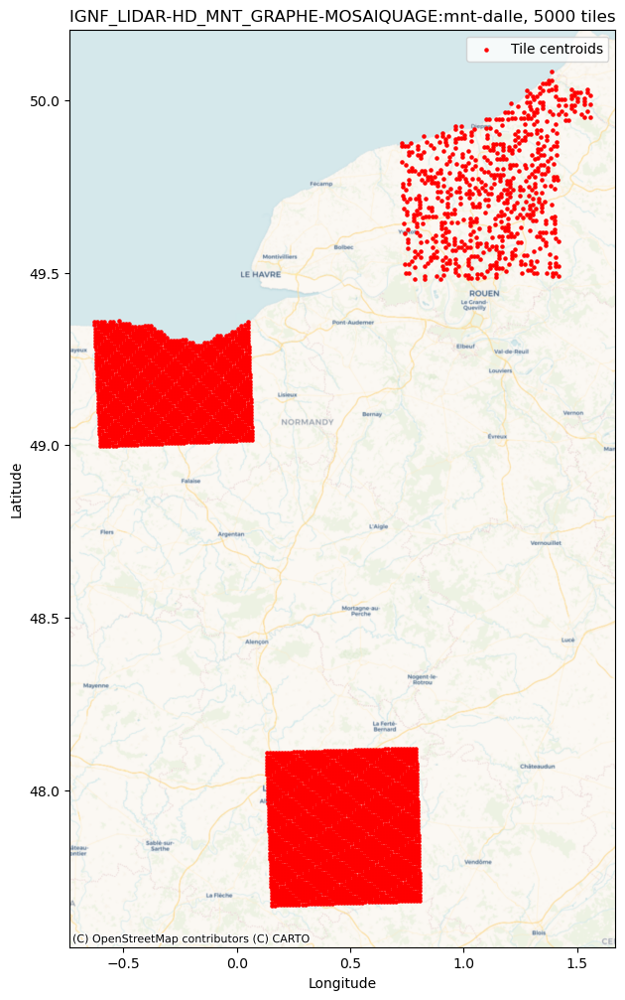

Number of tiles: 5000


/opt/conda/envs/ri-ml-base/lib/python3.12/site-packages/contextily/tile.py:645: UserWarning: The inferred zoom level of 25 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


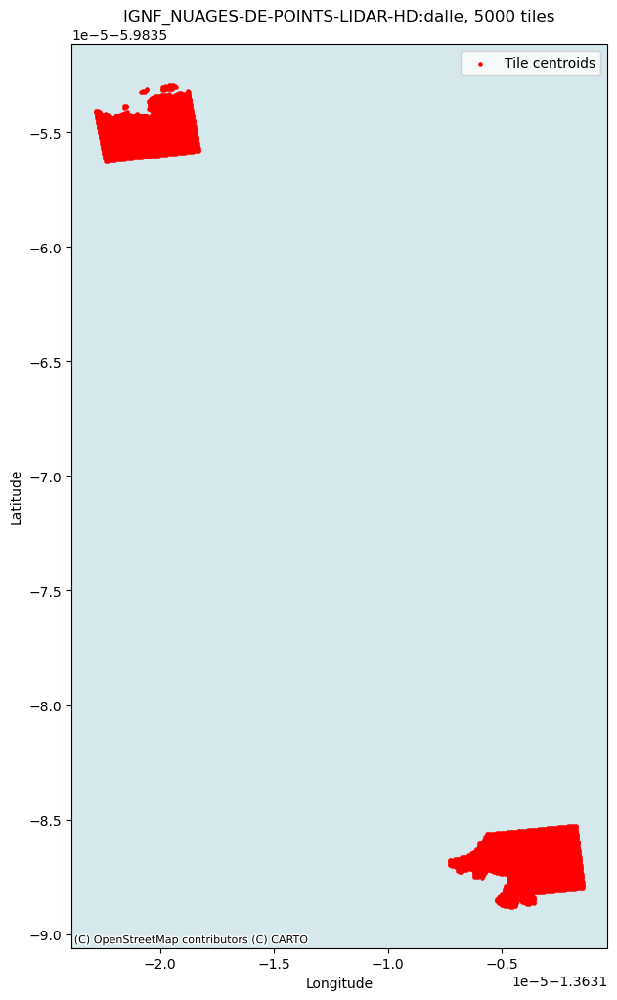

Number of tiles: 5000


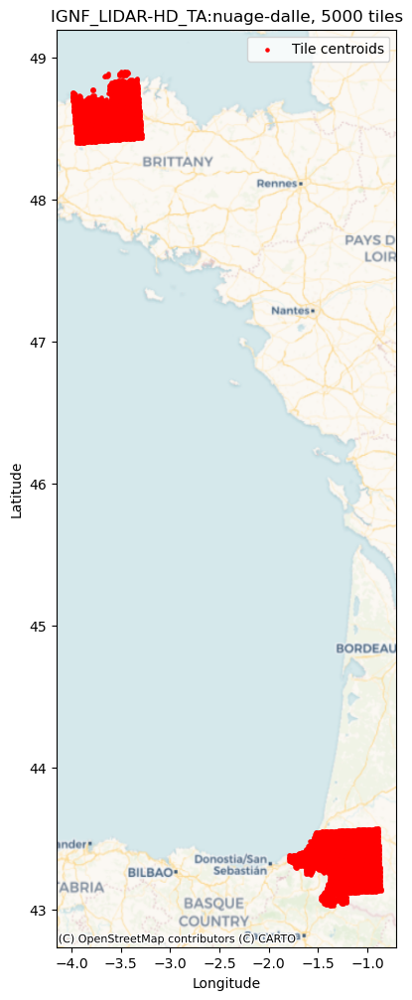

In [10]:
layers = list_layers_wfs("https://data.geopf.fr/wfs/ows")

lidar_layers = [l for l in layers if "LIDAR" in l.upper()]
print("Available LiDAR layers:")
for layer in lidar_layers:
    gdf = get_tile_index(layer)

    print("Number of tiles:", len(gdf))
    name = f"{layer}, {len(gdf)} tiles"
    plot_tile_centroids_with_basemap(gdf, name)

### Select the MNS:dalle (at least for test)
* MNS means "modele numerique de surface" stands for DSM (Digital Surface Model)

In [11]:
layer = "IGNF_LIDAR-HD_MNS_GRAPHE-MOSAIQUAGE:mns-dalle"

### From this database we will
* Find the titles that intersect our ROI
* Download them in the lidar_dir

In [12]:
gdf = get_tile_index(layer)

print("BBox in Lambert-93:", bbox_l93)
sel = filter_tiles(gdf, bbox_l93)
print("Selected tiles: ", len(sel))

download_tiles(sel, url_field="url", out_dir=lidar_original_dir)

BBox in Lambert-93: {'lon_min': 458757.8453032193, 'lat_min': 6903975.5040342705, 'lon_max': 460307.31886471785, 'lat_max': 6906137.2847329695}
Selected tiles:  12
Already have /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=459999.75,6903000.25,460999.75,6904000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0460_6904_MNS_O_0M50_LAMB93_IGN69.tif
Already have /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=457999.75,6905000.25,458999.75,6906000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0458_6906_MNS_O_0M50_LAMB93_IGN69.tif
Already have /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=458999.75,6906000.25,459999.75,6907000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0459_6907_MNS_O_0M50_LAMB93_IGN69.tif
Already have /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=458999.75,6904000.25,459999.75,6905000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0459_6905_MNS_O_0M50_LAMB9

* We can visualize all the titles we downloaded

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=457999.75,6905000.25,458999.75,6906000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0458_6906_MNS_O_0M50_LAMB93_IGN69.tif


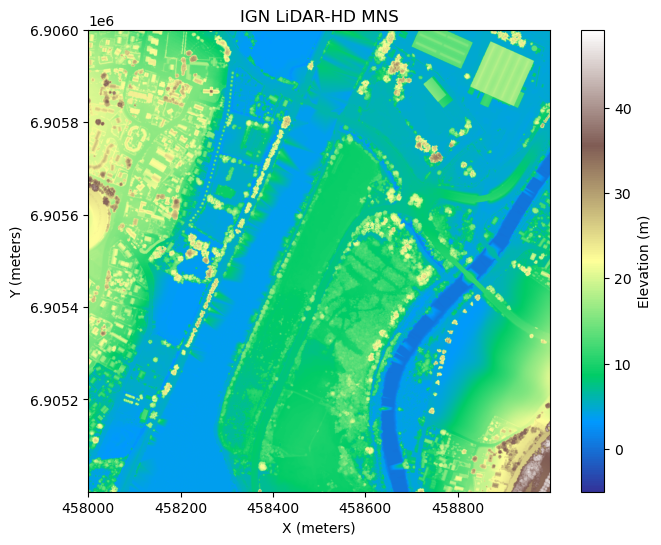

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=459999.75,6906000.25,460999.75,6907000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0460_6907_MNS_O_0M50_LAMB93_IGN69.tif


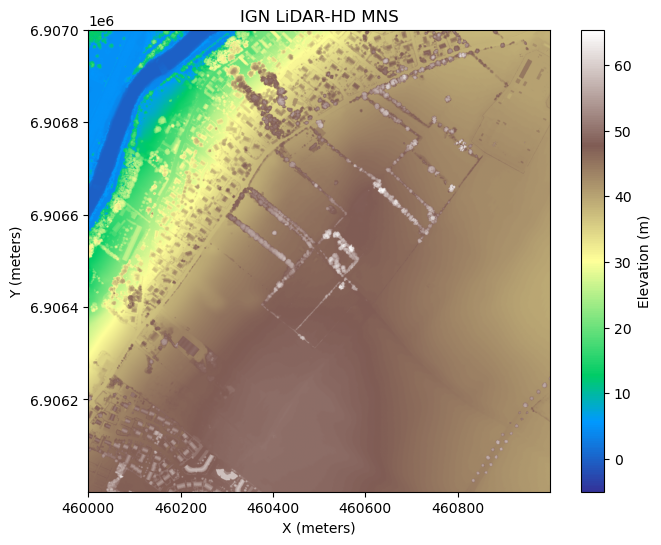

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=458999.75,6903000.25,459999.75,6904000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0459_6904_MNS_O_0M50_LAMB93_IGN69.tif


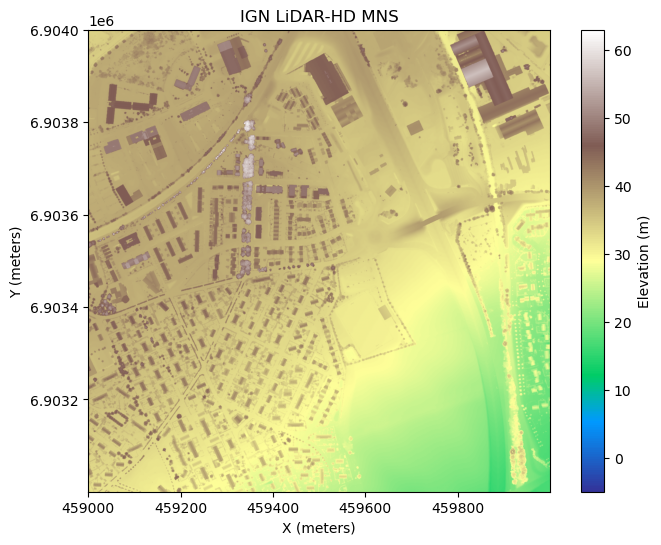

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=457999.75,6904000.25,458999.75,6905000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0458_6905_MNS_O_0M50_LAMB93_IGN69.tif


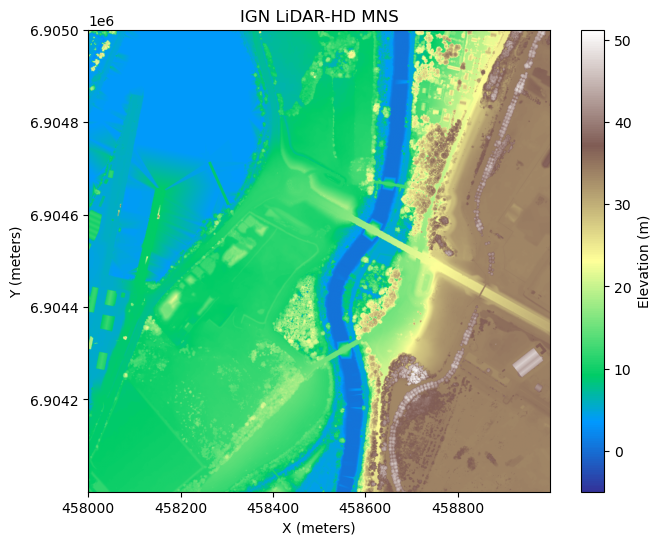

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=459999.75,6903000.25,460999.75,6904000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0460_6904_MNS_O_0M50_LAMB93_IGN69.tif


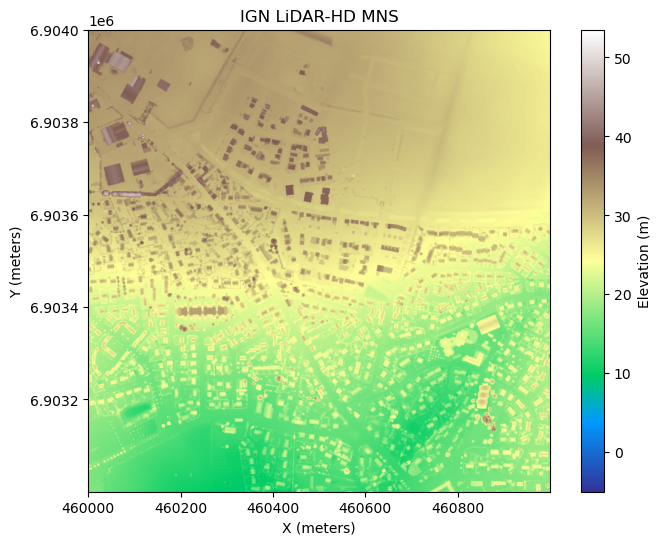

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=459999.75,6904000.25,460999.75,6905000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0460_6905_MNS_O_0M50_LAMB93_IGN69.tif


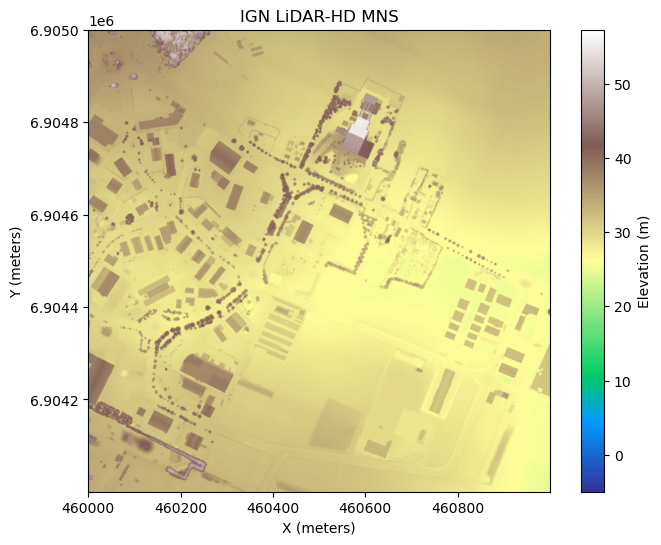

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=459999.75,6905000.25,460999.75,6906000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0460_6906_MNS_O_0M50_LAMB93_IGN69.tif


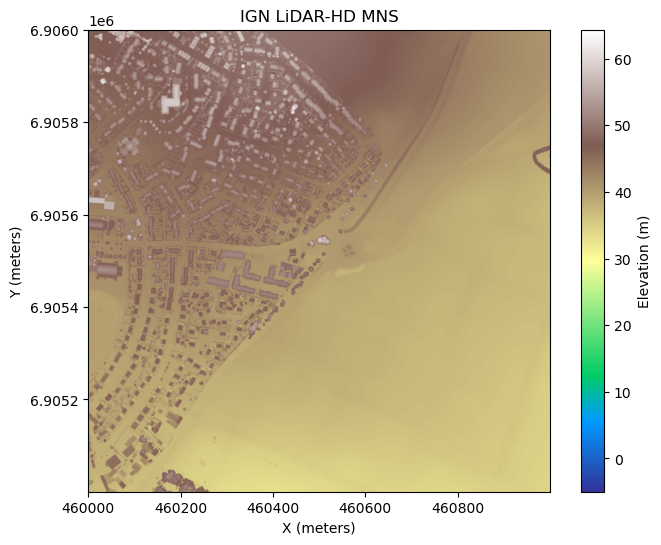

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=458999.75,6906000.25,459999.75,6907000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0459_6907_MNS_O_0M50_LAMB93_IGN69.tif


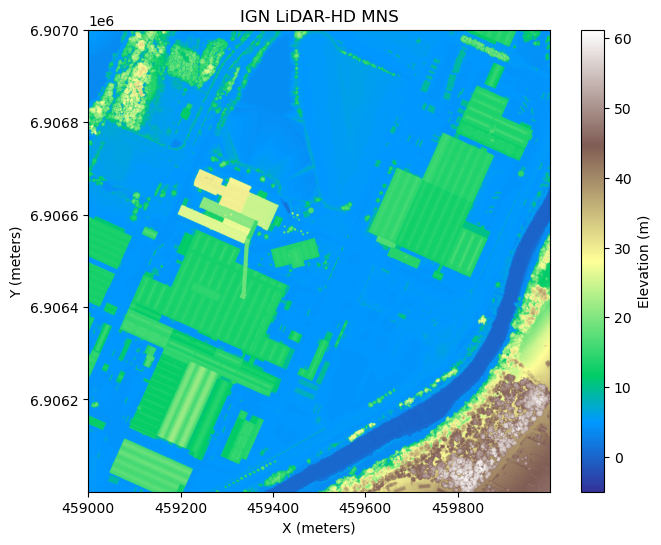

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=458999.75,6905000.25,459999.75,6906000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0459_6906_MNS_O_0M50_LAMB93_IGN69.tif


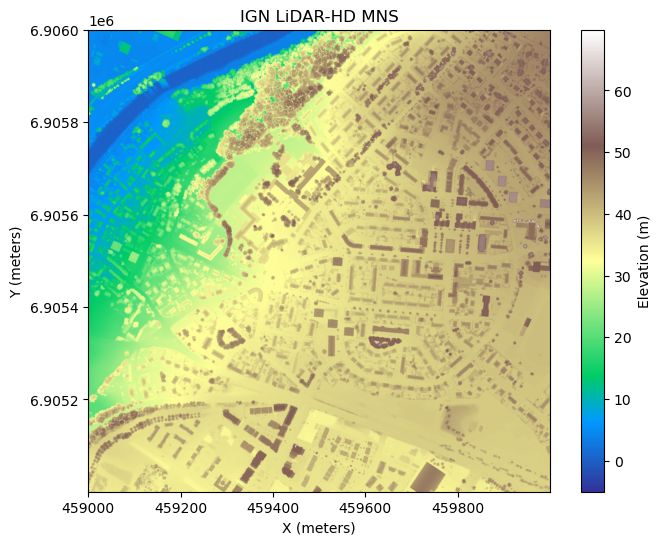

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=457999.75,6906000.25,458999.75,6907000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0458_6907_MNS_O_0M50_LAMB93_IGN69.tif


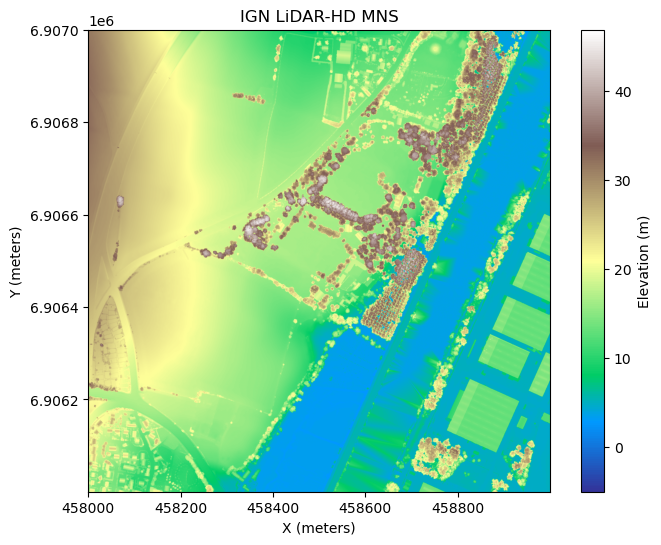

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=458999.75,6904000.25,459999.75,6905000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0459_6905_MNS_O_0M50_LAMB93_IGN69.tif


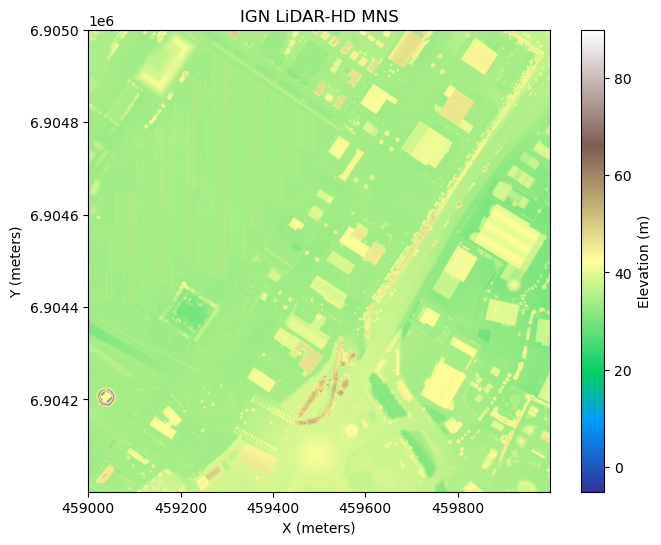

Opening: /home/renauld/DSM/data/Caen/lidar50cm_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=457999.75,6903000.25,458999.75,6904000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0458_6904_MNS_O_0M50_LAMB93_IGN69.tif


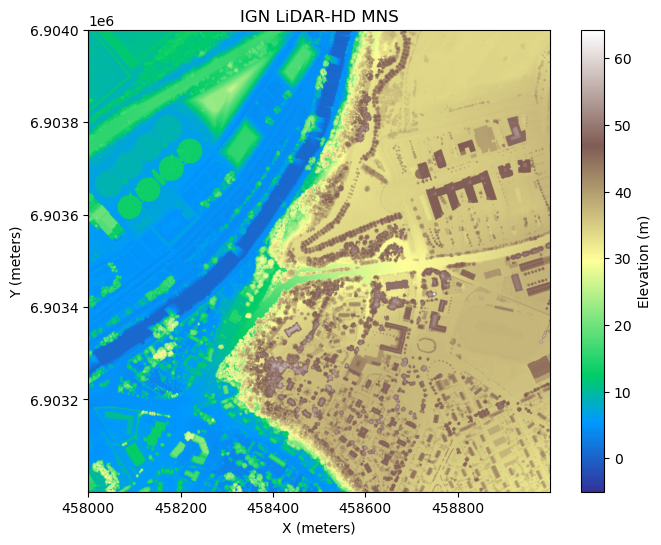

In [13]:
vmin = -5

for root, dirs, files in os.walk(lidar_original_dir):
    for f in files:
        if f.endswith(".tif"):
            file_path = os.path.join(root, f)
            print("Opening:", file_path)

            with rasterio.open(file_path) as src:
                dem = src.read(1)
                transform = src.transform  # affine transform

                # Get bounds (xmin, ymin, xmax, ymax)
                bounds = src.bounds
                extent = (bounds.left, bounds.right, bounds.bottom, bounds.top)

                plt.figure(figsize=(8,6))
                plt.imshow(
                    dem,
                    cmap="terrain",
                    extent=extent,      # <-- HERE
                    origin="upper", 
                    vmin = vmin
                )
                plt.colorbar(label="Elevation (m)")
                plt.title("IGN LiDAR-HD MNS")
                plt.xlabel("X (meters)")
                plt.ylabel("Y (meters)")
                plt.show()


* Recombine them to obtain the expected ROI 
* Save the result in lidar_output_dir
* Visualize it

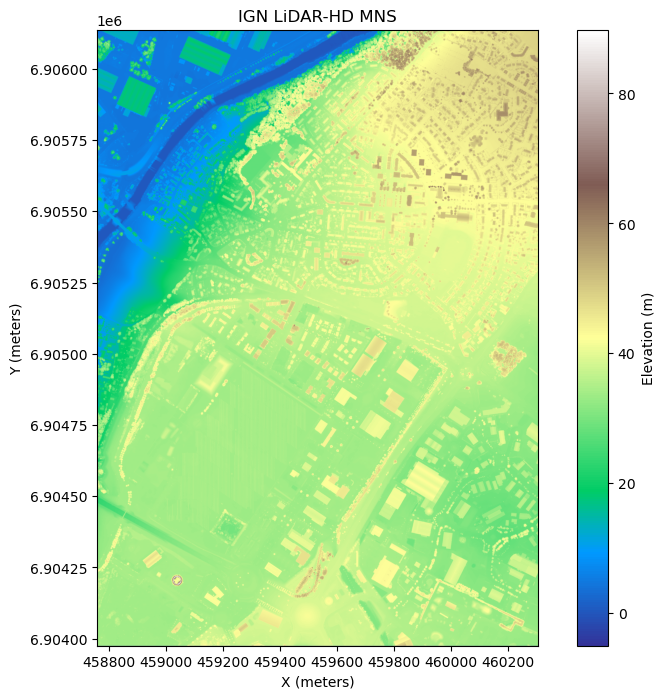

In [14]:

output_lidar_merged = os.path.join(lidar_output_dir, f"{area}_clipped_merged_mns.tif")
tile_paths = [os.path.join(lidar_original_dir, f) for f in os.listdir(lidar_original_dir) if f.endswith(".tif")]

clipped, clipped_transform = clip_and_merge_tiles(tile_paths, roi_geom_l93, output_lidar_merged)


with rasterio.open(output_lidar_merged) as src:
    lidar_image = src.read(1)

    # Get bounds (xmin, ymin, xmax, ymax)
    bounds = src.bounds
    extent = (bounds.left, bounds.right, bounds.bottom, bounds.top)

    plt.figure(figsize=(10,8))
    plt.imshow(
        lidar_image,
        cmap="terrain",
        extent=extent,      # <-- HERE
        origin="upper", 
        vmin = vmin
    )
    plt.colorbar(label="Elevation (m)")
    plt.title(f"IGN LiDAR-HD MNS")
    plt.xlabel("X (meters)")
    plt.ylabel("Y (meters)")
    plt.show()



### Download Copernicus data
* DSM 30m resolution
* Available everywhere in the world
* Just need the bounding box (no need to recombine tiles)

Request: https://portal.opentopography.org/API/globaldem?demtype=COP30&south=49.190000000000005&north=49.21&west=-0.31&east=-0.29&outputFormat=GTiff&API_Key=38b3211483d503ddd81882f2259b6201
✅ Saved → /home/renauld/DSM/data/Caen/cop30m_tiles/Caen_cop_dem30m.tif


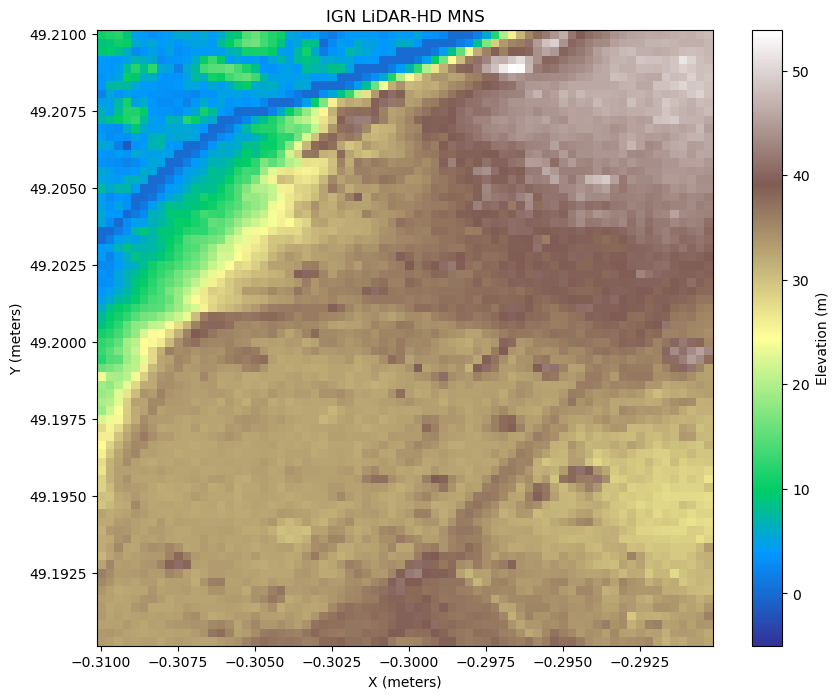

In [15]:

output_cop = os.path.join(cop_dir, f"{area}_cop_dem30m.tif")
download_cop_dem(bbox_wgs84, api_key, output_cop)

with rasterio.open(output_cop) as src:
    cop_image = src.read(1)

    # Get bounds (xmin, ymin, xmax, ymax)
    bounds = src.bounds
    extent = (bounds.left, bounds.right, bounds.bottom, bounds.top)

    plt.figure(figsize=(10,8))
    plt.imshow(
        cop_image,
        cmap="terrain",
        extent=extent,      # <-- HERE
        origin="upper", 
        vmin = vmin
    )
    plt.colorbar(label="Elevation (m)")
    plt.title(f"IGN LiDAR-HD MNS")
    plt.xlabel("X (meters)")
    plt.ylabel("Y (meters)")
    plt.show()

    

* Download a contextly image
* Plot the 3 images together (will and without equal max)

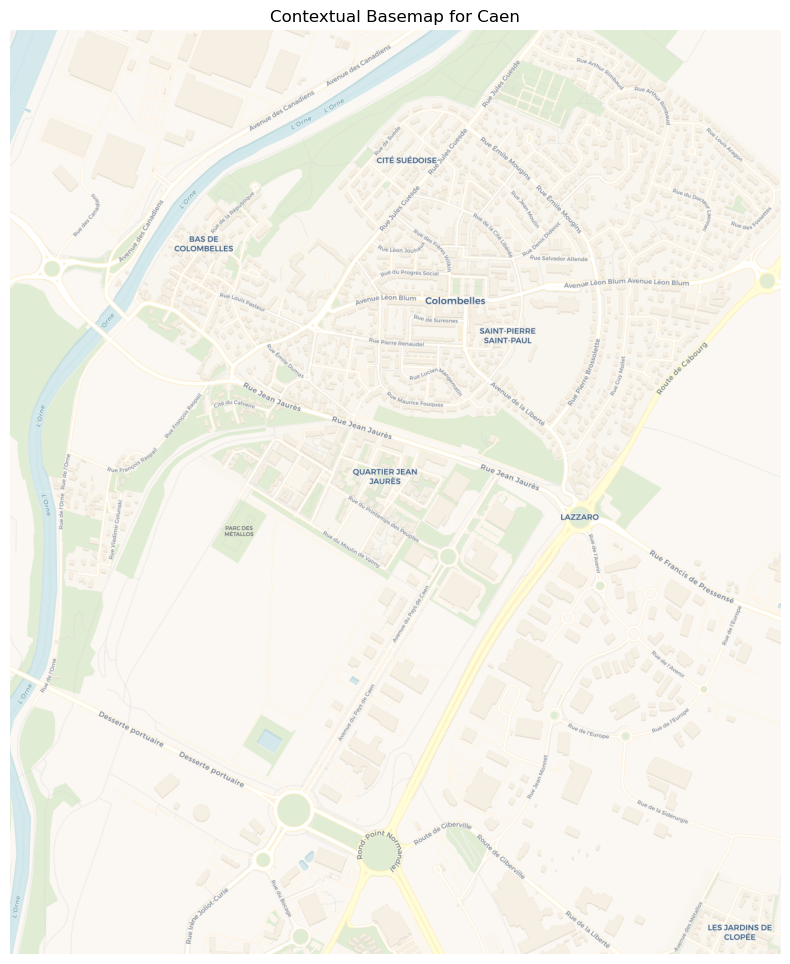

In [16]:
cx_image = download_contextly_image(bbox_wgs84)
plt.figure(figsize=(14,12))
plt.imshow(cx_image)
plt.title(f"Contextual Basemap for {area}")
plt.axis('off')
plt.show()

Text(0.5, 0.98, 'DSM Comparison for Caen with equal max')

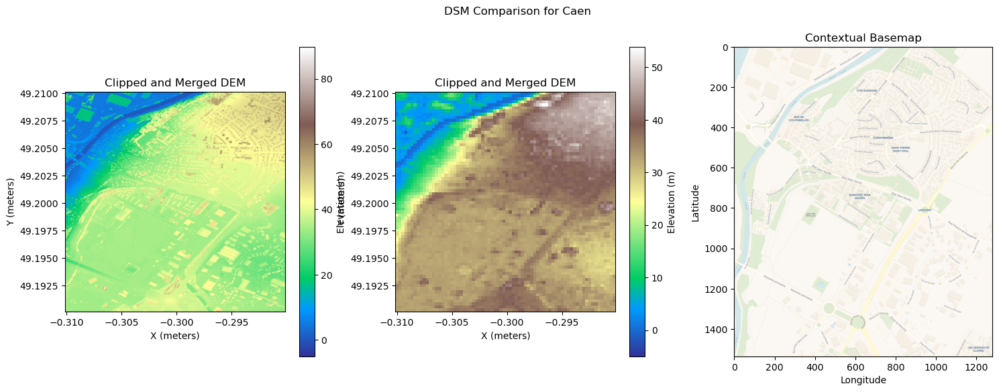

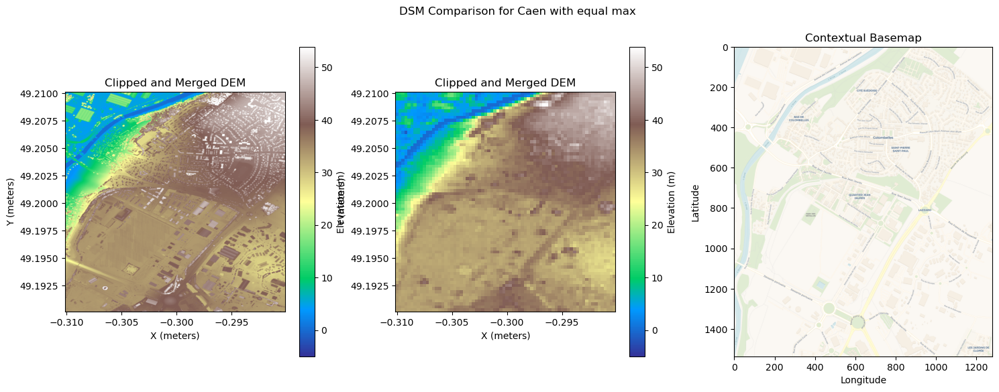

In [17]:
  
fig, ax = plt.subplots(1, 3, figsize=(18, 6))   # 1 row, 3 columns

im0 = ax[0].imshow(
        lidar_image,
        cmap="terrain",
        extent=extent,      # <-- HERE
        origin="upper", 
        vmin = vmin
    )

ax[0].set_title("Clipped and Merged DEM")
ax[0].set_xlabel("X (meters)")
ax[0].set_ylabel("Y (meters)")
fig.colorbar(im0, ax=ax[0], label="Elevation (m)")

im1 = ax[1].imshow(
        cop_image,
        cmap="terrain",
        extent=extent,      # <-- HERE
        origin="upper", 
        vmin = vmin
    )

ax[1].set_title("Clipped and Merged DEM")
ax[1].set_xlabel("X (meters)")
ax[1].set_ylabel("Y (meters)")
fig.colorbar(im1, ax=ax[1], label="Elevation (m)")

ax[2].imshow(cx_image)
ax[2].set_title("Contextual Basemap")
ax[2].set_xlabel("Longitude")
ax[2].set_ylabel("Latitude")

fig.suptitle(f"DSM Comparison for {area}")

fig, ax = plt.subplots(1, 3, figsize=(18, 6))   # 1 row, 3 columns

im0 = ax[0].imshow(
        lidar_image,
        cmap="terrain",
        extent=extent,      # <-- HERE
        origin="upper", 
        vmin = vmin, 
        vmax=cop_image.max()
    )

ax[0].set_title("Clipped and Merged DEM")
ax[0].set_xlabel("X (meters)")
ax[0].set_ylabel("Y (meters)")
fig.colorbar(im0, ax=ax[0], label="Elevation (m)")

im1 = ax[1].imshow(
        cop_image,
        cmap="terrain",
        extent=extent,      # <-- HERE
        origin="upper", 
        vmin = vmin, 
        vmax=cop_image.max()
    )

ax[1].set_title("Clipped and Merged DEM")
ax[1].set_xlabel("X (meters)")
ax[1].set_ylabel("Y (meters)")
fig.colorbar(im1, ax=ax[1], label="Elevation (m)")

ax[2].imshow(cx_image)
ax[2].set_title("Contextual Basemap")
ax[2].set_xlabel("Longitude")
ax[2].set_ylabel("Latitude")

fig.suptitle(f"DSM Comparison for {area} with equal max")
